# 2.1. EDA EMBEDDINGS

– Exploración de embeddings y relaciones con otras variables

!! LIMPIARLO 

In [1]:
import pandas as pd
import numpy  as np
import seaborn as sns        
import matplotlib.pyplot as plt 
import glob
import os
import time    
import re
import plotly.express as px
import umap
from umap.umap_ import UMAP           # <- importante: umap-learn
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import hdbscan
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
import plotly.express as px
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk
from wordcloud import WordCloud

### Reducción de dimensionalidad de embeddings y clusterización

Una vez obtenidas los embeddings aplicamos **UMAP** para reducir las dimensiones de 384 a 5, permitiendo posicionar estos embeddings en un **espacio semántico** más manejable.  

A continuación, utilizamos **HDBSCAN** para clusterizar los grupos distribuidos en el espacio reducido. Finalmente, se proyectaron los clusters a dos dimensiones, lo que facilita una **representación visual** de cómo se distribuyen los grupos a lo largo de los ejes X e Y.

In [ ]:
df_1=pd.read_parquet("df_TFMYouTube_embeddings_UMAP5_CLUSTERS_UMAP2.parquet")

In [3]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17825 entries, 0 to 17824
Data columns (total 40 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   video_id                 17825 non-null  object 
 1   title                    17825 non-null  object 
 2   description              14298 non-null  object 
 3   duration_minutes         17825 non-null  float64
 4   definition               17825 non-null  int64  
 5   licensed_content         17825 non-null  Int64  
 6   has_caption              17825 non-null  Int64  
 7   category_id              17825 non-null  float64
 8   views                    17825 non-null  int64  
 9   likes                    17825 non-null  int64  
 10  comments                 17825 non-null  int64  
 11  tags                     9952 non-null   object 
 12  tags_count               17825 non-null  int64  
 13  views_per_day            17825 non-null  int64  
 14  video_age_days        

### Procesamiento de embeddings

Con este código a continuación se disminuyeron las dimensiones de los embeddings obtenidos, en 5 y luego 2 dimiensiones, para poder situarlas en un espacio físico (eje x e y). Además, se empleó la técnica HDBSCAN para generar clusters a partir de los grupos establecidos.

Una vez realizado este proceso se guardó la información en un dataset, y de esta forma evitar la ejecución de este proceso de re-dimensionalización y clusterización cada vez que se tuviera que ejecutara este código

In [4]:
#df_1=pd.read_parquet("/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/df_YouTube_2025TFM_DEFINITIVO.parquet")
# X = np.vstack(df_1["embedding_joint"].to_numpy())   # <- joint_emb

# # # ===================== 1) UMAP a 5D (Preclusterización) =====================


# umap5 = UMAP(
#     n_components=5,
#     n_neighbors=50,
#     min_dist=0.1,
#     metric="cosine",
#     random_state=42,
#     verbose=True
# )
#X_umap5 = umap5.fit_transform(X)  # (n, 5)

# # # ===================== 2) Clustering con HDBSCAN (sobre 5D) =====================
# clusterer = hdbscan.HDBSCAN(
#     min_cluster_size=30,           # ajusta 30–100 según tu N
#     min_samples=None,              # o p.ej. 10 si quieres clusters más conservadores
#     metric="euclidean",            # tras UMAP usa euclidean
#     cluster_selection_method="eom",
#     prediction_data=True
# )
# labels = clusterer.fit_predict(X_umap5)         # -1 = ruido
# probs   = clusterer.probabilities_

# # # Añadimos resultados al DF
# df_1["cluster_umap5"] = labels
# df_1["cluster_confidence"] = probs


# # # ===================== 3) UMAP a 2D (solo para visualización) =====================
# umap2 = UMAP(
#     n_components=2,
#     n_neighbors=50,
#     min_dist=0.1,
#     metric="cosine",
#     random_state=42,
#     verbose=False
# )
# X_umap2 = umap2.fit_transform(X)  # puedes usar X o X_umap5 (ambas válidas para visualizar)

# df_1["umap2_x"] = X_umap2[:, 0]
# df_1["umap2_y"] = X_umap2[:, 1]

# df_1.to_parquet(
#       "/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/df_TFMYouTube_embeddings_UMAP5_CLUSTERS_UMAP2.parquet",
#      index=False)


In [5]:
df=pd.read_parquet("/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/df_TFMYouTube_embeddings_UMAP5_CLUSTERS_UMAP2.parquet")

/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_98435/3872870649.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("tab20", max(1, len(valid_clusters)))


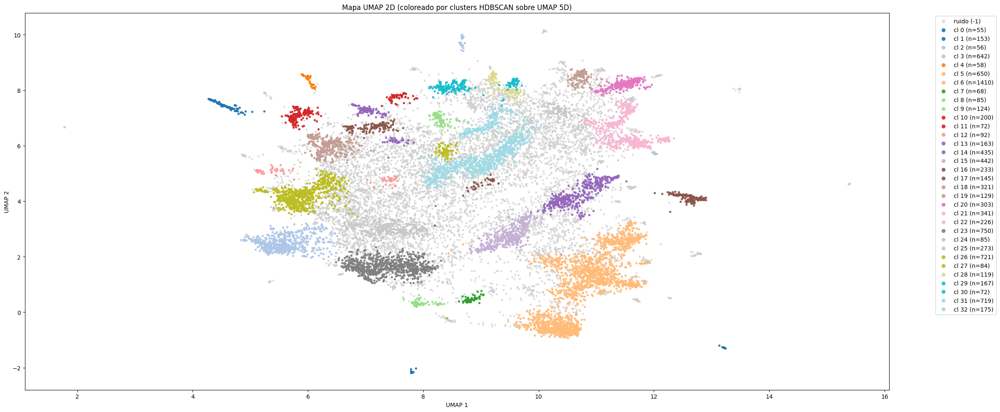

In [6]:
plt.figure(figsize=(24,10))
# colorea ruido en gris claro
is_noise = df["cluster_umap5"] == -1
plt.scatter(df.loc[is_noise, "umap2_x"], df.loc[is_noise, "umap2_y"],
            s=6, c="#cccccc", alpha=0.6, label="ruido (-1)")

# colorea cada cluster con un color distinto
valid_clusters = sorted(c for c in df["cluster_umap5"].unique() if c != -1)
cmap = plt.cm.get_cmap("tab20", max(1, len(valid_clusters)))
for i, cl in enumerate(valid_clusters):
    m = df["cluster_umap5"] == cl
    plt.scatter(df.loc[m, "umap2_x"], df.loc[m, "umap2_y"],
                s=8, c=[cmap(i)], alpha=0.9, label=f"cl {cl} (n={m.sum()})")

plt.title("Mapa UMAP 2D (coloreado por clusters HDBSCAN sobre UMAP 5D)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(markerscale=2, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# # ===================== 6) (Opcional) Top términos por cluster =====================
# # Si tienes el texto del vídeo en df["text_video"], puedes extraer términos representativos:


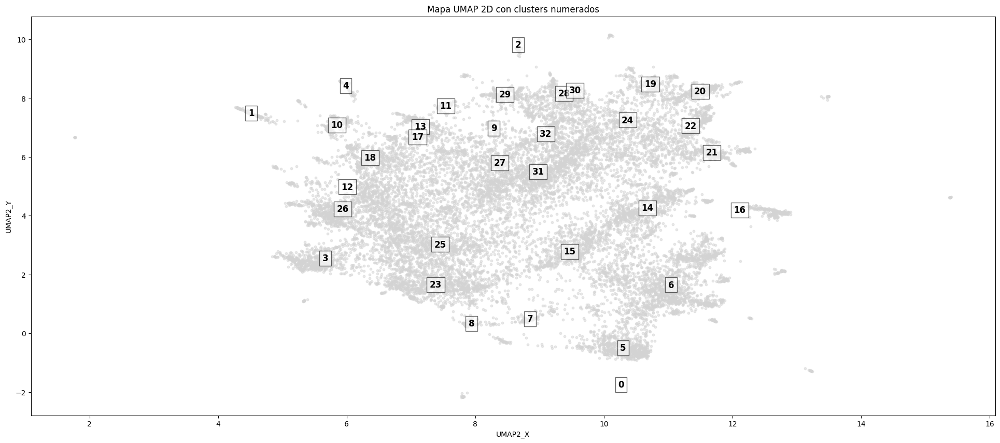

In [7]:
plt.figure(figsize=(24,10))
plt.scatter(df["umap2_x"], df["umap2_y"], color="lightgrey", s=10, alpha=0.5)

# Calcular centroides
centroids = df.groupby("cluster_umap5")[["umap2_x","umap2_y"]].mean().reset_index()

# Poner números de cluster
for _, row in centroids.iterrows():
    if row["cluster_umap5"] == -1:
        continue
    plt.text(row["umap2_x"], row["umap2_y"], str(int(row["cluster_umap5"])),
             fontsize=12, fontweight="bold", ha="center", va="center",
             bbox=dict(facecolor="white", alpha=0.6, edgecolor="black"))

plt.title("Mapa UMAP 2D con clusters numerados")
plt.xlabel("UMAP2_X")
plt.ylabel("UMAP2_Y")
plt.show()
# umap_df = pd.DataFrame(X_umap5[:, :2], columns=["UMAP1","UMAP2"])
# umap_df["cluster"] = df["cluster_umap5"].values
# umap2d = UMAP(n_components=2, n_neighbors=30, min_dist=0.1, metric="cosine", random_state=42)
# X_umap2 = umap2d.fit_transform(X_embeddings)

# # Crear DataFrame para scatter
# umap_df = pd.DataFrame(X_umap2, columns=["UMAP1","UMAP2"])
# umap_df["cluster"] = df["cluster_umap5"].values

# # Calcular centroides
# centroids = umap_df.groupby("cluster")[["UMAP1","UMAP2"]].mean().reset_index()
# plt.figure(figsize=(24,10))

# # Dibujar todos los puntos en gris (ruido incluido)
# plt.scatter(umap_df["UMAP1"], umap_df["UMAP2"], color="lightgrey", s=10, alpha=0.5)

# # Dibujar los centroides con etiquetas de cluster
# for _, row in centroids.iterrows():
#     if row["cluster"] == -1:  # opcional: omitir el ruido
#         continue
#     plt.text(row["UMAP1"], row["UMAP2"], str(int(row["cluster"])),
#              fontsize=12, fontweight="bold", ha="center", va="center",
#              bbox=dict(facecolor="white", alpha=0.6, edgecolor="black"))

# plt.title("Mapa UMAP 2D con clusters numerados")
# plt.xlabel("UMAP1")
# plt.ylabel("UMAP2")
# plt.show()

In [8]:
cluster_counts = (
    df.loc[df["cluster_umap5"] != -1, "cluster_umap5"]
      .value_counts()
      .sort_index()
)
print("Tamaño de clusters (sin ruido):")
print(cluster_counts)

noise_pct = (df["cluster_umap5"] == -1).mean()
print(f"% Ruido HDBSCAN: {noise_pct:.1%}")

Tamaño de clusters (sin ruido):
cluster_umap5
0       55
1      153
2       56
3      642
4       58
5      650
6     1410
7       68
8       85
9      124
10     200
11      72
12      92
13     163
14     435
15     442
16     233
17     145
18     321
19     129
20     303
21     341
22     226
23     750
24      85
25     273
26     721
27      84
28     119
29     167
30      72
31     719
32     175
Name: count, dtype: int64
% Ruido HDBSCAN: 46.3%


In [9]:
counts = df["cluster_umap5"].value_counts().sort_index()  # ordena por cluster
# # Convertir a porcentaje
percentages = counts / counts.sum() * 100

# # Mostrar resultados
# for cluster, pct in percentages.items():
#     print(f"Cluster {cluster}: {pct:.2f}%")
df_summary = pd.DataFrame({
    "cluster": counts.index,
    "count": counts.values,
    "percentage": percentages.values
})
display(df_summary)

,cluster,count,percentage
0,-1,8257,46.322581
1,0,55,0.308555
2,1,153,0.858345
3,2,56,0.314165
4,3,642,3.601683
5,4,58,0.325386
6,5,650,3.646564
7,6,1410,7.910238
8,7,68,0.381487
9,8,85,0.476858


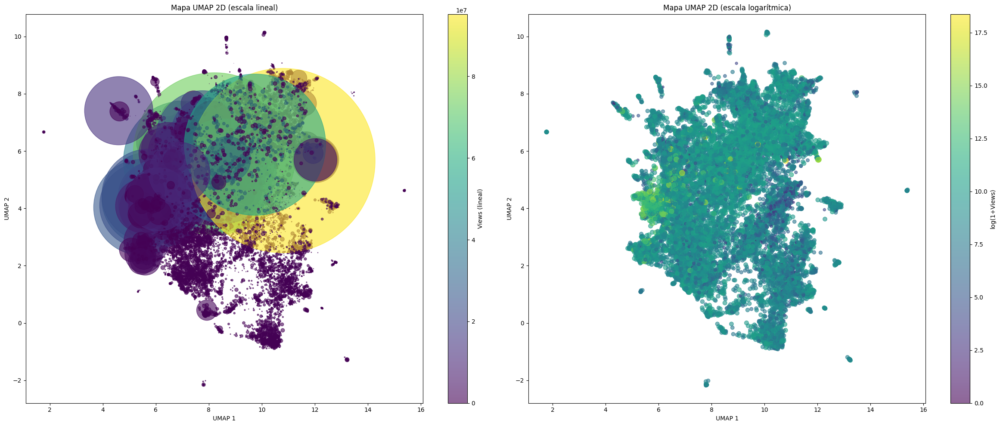

In [10]:

# --- Scatter con escala LINEAL ---
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["views"], cmap="viridis", 
            s=df["views"]/1000, alpha=0.6)   # tamaño lineal (puedes ajustar /1000)
plt.colorbar(label="Views (lineal)")
plt.title("Mapa UMAP 2D (escala lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Scatter con escala LOGARÍTMICA ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["views"]), cmap="viridis", 
            s=np.log1p(df["views"])*5, alpha=0.6)  # tamaño log
plt.colorbar(label="log(1+Views)")
plt.title("Mapa UMAP 2D (escala logarítmica)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()
plt.show()

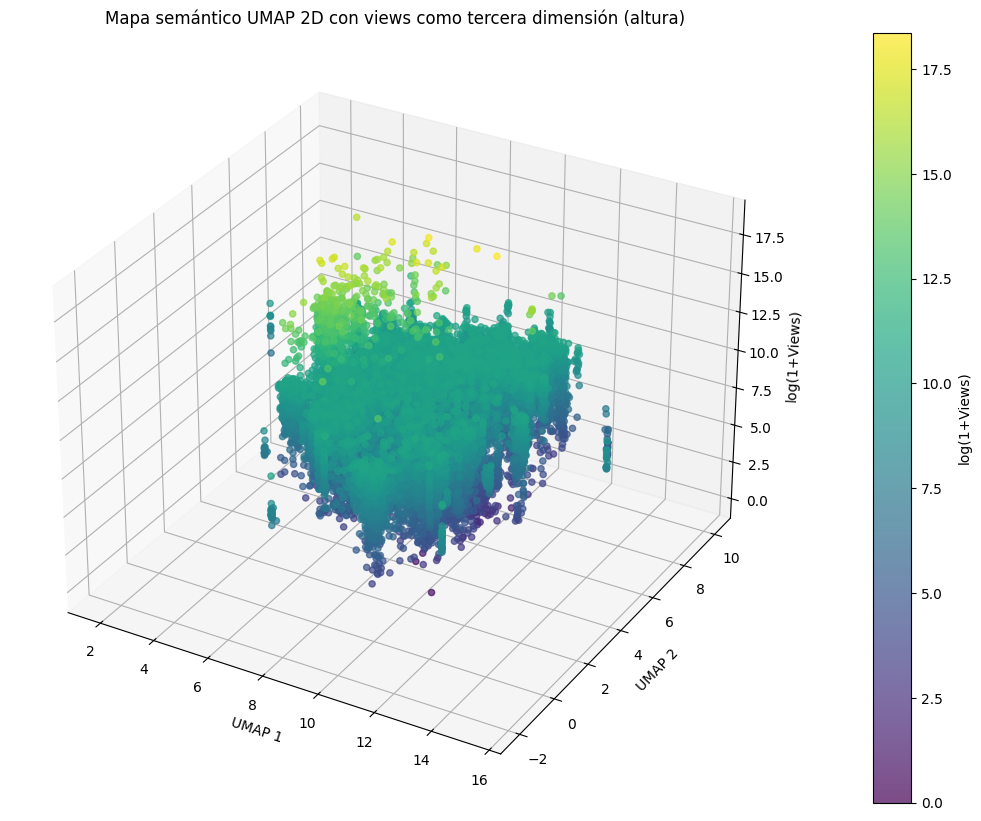

In [11]:

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')

# UMAP en 2D → x, y
x = df["umap2_x"]
y = df["umap2_y"]

# La variable extra (ej. views) → z
z = np.log1p(df["views"])   # usar log para que no revienten los outliers

# Scatter 3D
sc = ax.scatter(x, y, z, 
                c=z, cmap="viridis", s=20, alpha=0.7)

ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_zlabel("log(1+Views)")
ax.set_title("Mapa semántico UMAP 2D con views como tercera dimensión (altura)")
fig.colorbar(sc, ax=ax, label="log(1+Views)")

plt.show()

In [12]:
z=df.groupby("cluster_umap5")["views"].median().sort_values(ascending=False).head()
print(f"valores de likes por /{z}")


valores de likes por /cluster_umap5
26    67047.0
27    25700.5
11    25255.0
32    24650.0
31    21086.0
Name: views, dtype: float64


Text(0, 0.5, 'UMAP 2')

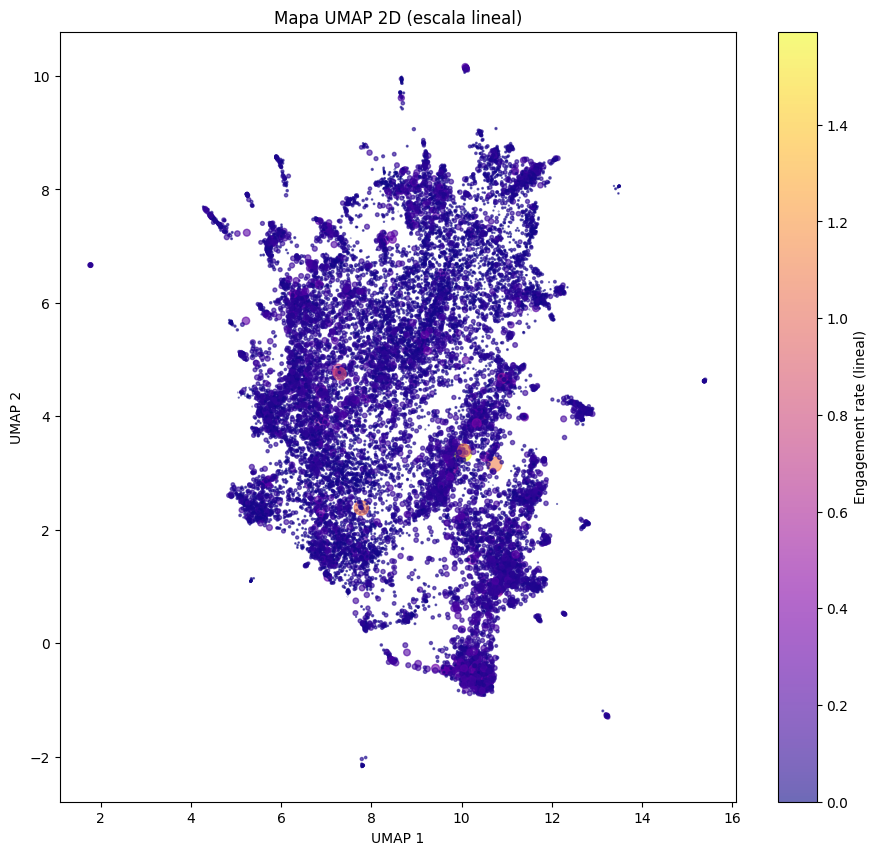

In [13]:
# Aseguramos que no haya valores negativos o NaN
df["engagement_rate"] = df["engagement_rate"].clip(lower=0).fillna(0)

plt.figure(figsize=(24,10))
#plt.axis("equal")
# --- Scatter con escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["engagement_rate"], cmap="plasma",
            s=df["engagement_rate"]*100, alpha=0.6)   # tamaño proporcional lineal
plt.colorbar(label="Engagement rate (lineal)")
plt.title("Mapa UMAP 2D (escala lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")



In [14]:
df.groupby("cluster_umap5")["engagement_rate"].median().sort_values(ascending=False).head()

cluster_umap5
5     0.073765
15    0.056342
13    0.054714
6     0.053773
28    0.052222
Name: engagement_rate, dtype: float64

Text(0, 0.5, 'UMAP 2')

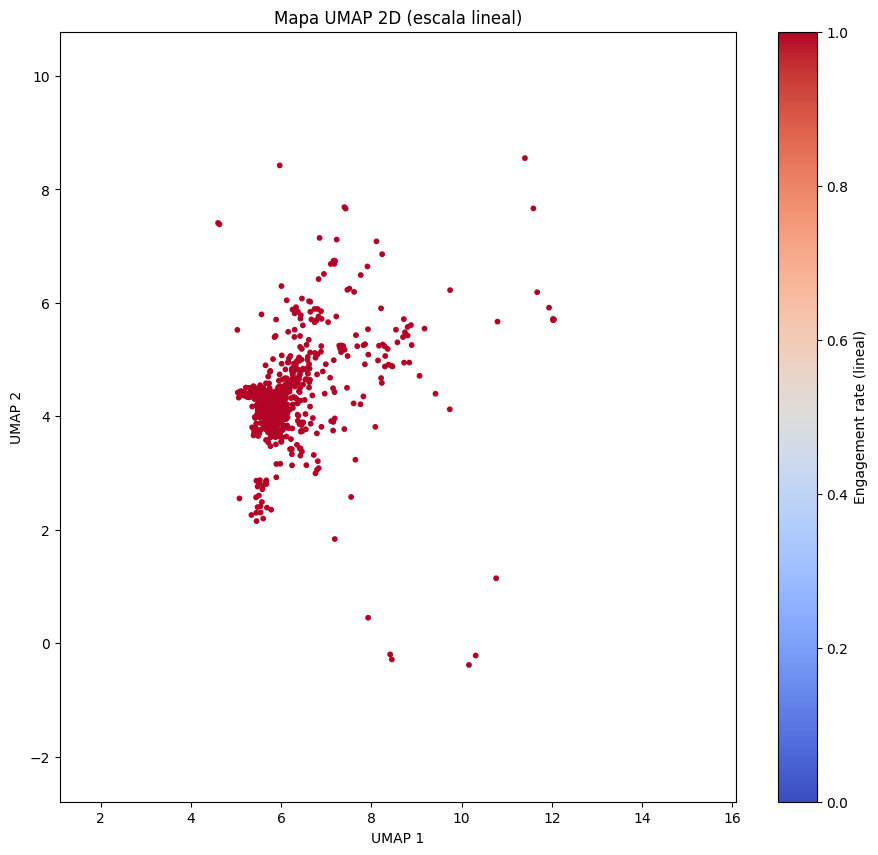

In [15]:
#df["mostpopular"] = df["mostpopular"].clip(lower=0).fillna(0)

plt.figure(figsize=(24,10))
#plt.axis("equal")
# --- Scatter con escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["mostpopular"], cmap="coolwarm",
            s=df["mostpopular"]*10, alpha=1)   # tamaño proporcional lineal
plt.colorbar(label="Engagement rate (lineal)")
plt.title("Mapa UMAP 2D (escala lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")


In [16]:
df.groupby("cluster_umap5")["mostpopular"].median().sort_values(ascending=False).head()

cluster_umap5
 26    1.0
-1     0.0
 24    0.0
 18    0.0
 19    0.0
Name: mostpopular, dtype: float64

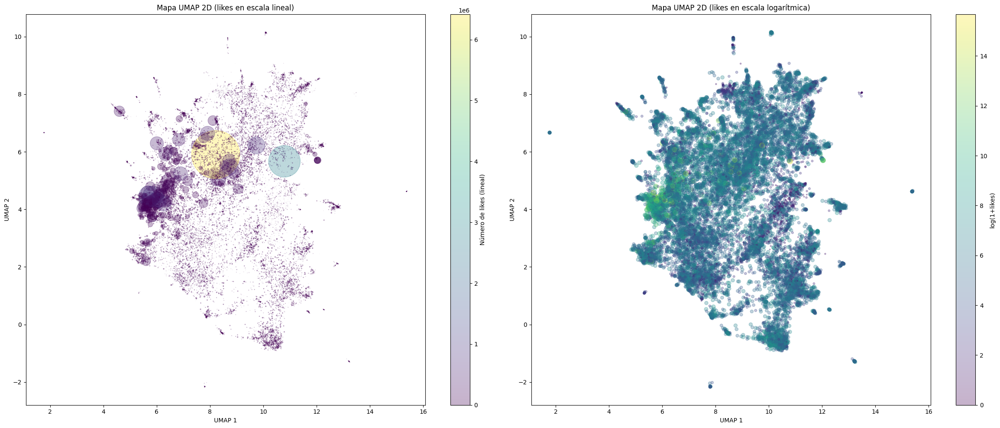

In [17]:
plt.figure(figsize=(24,10))

# --- Escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["likes"], cmap="viridis",
            s=df["likes"]/1000, alpha=0.3)   # escala lineal, divide para ajustar
plt.colorbar(label="Número de likes (lineal)")
plt.title("Mapa UMAP 2D (likes en escala lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Escala LOGARÍTMICA ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["likes"]), cmap="viridis",
            s=np.log1p(df["likes"])*5, alpha=0.3)  # escala log, multiplica para que se vea
plt.colorbar(label="log(1+likes)")
plt.title("Mapa UMAP 2D (likes en escala logarítmica)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()
plt.show()

In [18]:
df.groupby("cluster_umap5")["likes"].median().sort_values(ascending=False).head()

cluster_umap5
26    996.0
11    602.0
13    601.0
8     457.0
16    411.0
Name: likes, dtype: float64

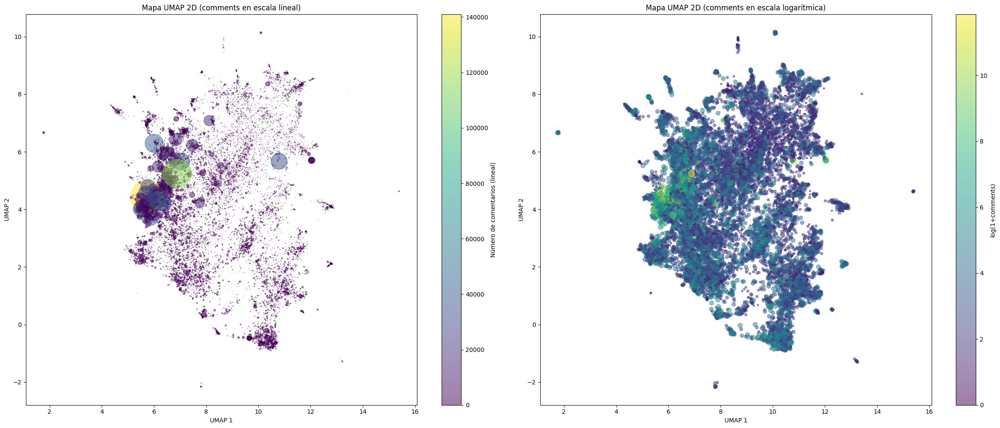

In [ ]:
plt.figure(figsize=(24,10))

# --- Escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["comments"], cmap="viridis",
            s=df["comments"]/50,   # divisor ajusta la escala, prueba /50 o /100
            alpha=0.5)
plt.colorbar(label="Número de comentarios (lineal)")
plt.title("Mapa UMAP 2D (comments en escala lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Escala LOGARÍTMICA ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["comments"]), cmap="viridis",
            s=np.log1p(df["comments"])*10,  # multiplicador para que se vean más grandes
            alpha=0.5)
plt.colorbar(label="log(1+comments)")
plt.title("Mapa UMAP 2D (comments en escala logarítmica)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()
plt.show()

In [20]:
df.groupby("cluster_umap5")["comments"].median().sort_values(ascending=False).head()

cluster_umap5
26    48.0
8     32.0
18    26.0
4     24.0
11    23.0
Name: comments, dtype: float64

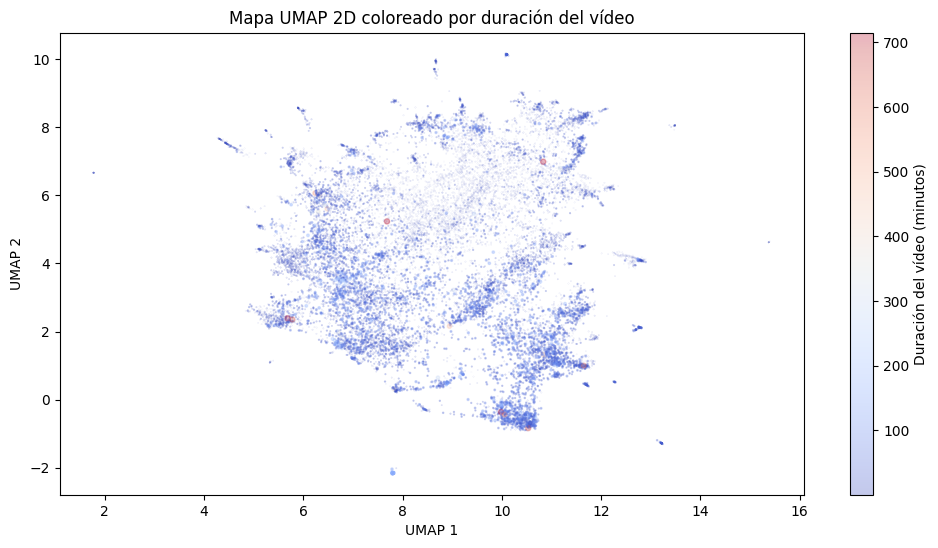

In [21]:
plt.figure(figsize=(12,6))
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["duration_minutes"], cmap="coolwarm",
            s=df["duration_minutes"]/50, alpha=0.3)   # divide para ajustar tamaño
plt.colorbar(label="Duración del vídeo (minutos)")
plt.title("Mapa UMAP 2D coloreado por duración del vídeo")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.show()

In [22]:
df.groupby("cluster_umap5")["duration_minutes"].median().sort_values(ascending=False).tail()

cluster_umap5
30    0.625000
16    0.600000
31    0.483333
32    0.433333
27    0.266667
Name: duration_minutes, dtype: float64

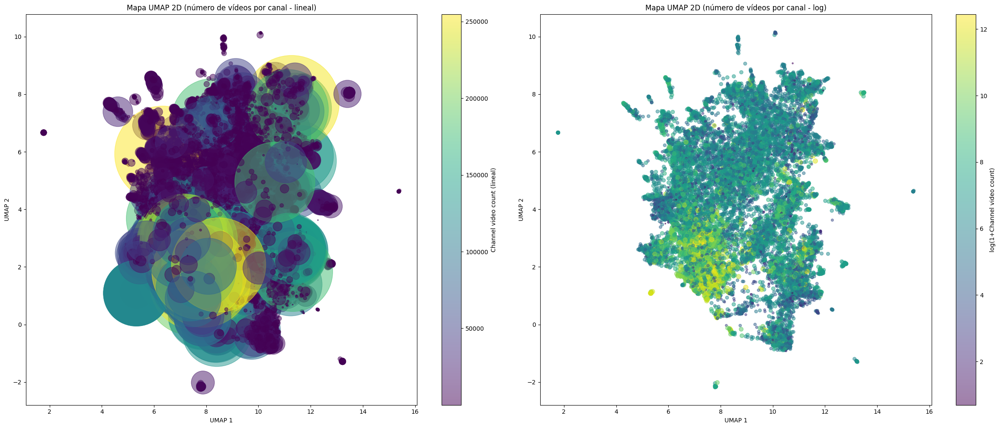

In [23]:
plt.figure(figsize=(24,10))

# --- Escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["channel_video_count"], cmap="viridis",
            s=df["channel_video_count"]/10, alpha=0.5)
plt.colorbar(label="Channel video count (lineal)")
plt.title("Mapa UMAP 2D (número de vídeos por canal - lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Escala LOGARÍTMICA ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["channel_video_count"]), cmap="viridis",
            s=np.log1p(df["channel_video_count"])*5, alpha=0.5)
plt.colorbar(label="log(1+Channel video count)")
plt.title("Mapa UMAP 2D (número de vídeos por canal - log)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()
plt.show()

In [24]:
df.groupby("cluster_umap5")["channel_video_count"].median().sort_values(ascending=False).head()

cluster_umap5
23    9467.5
25    8610.0
0     2046.0
10    1390.5
14     980.0
Name: channel_video_count, dtype: float64

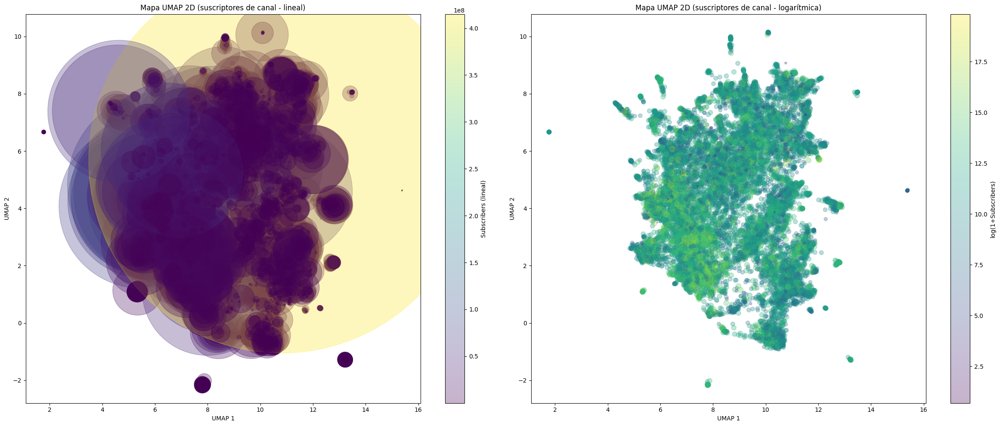

In [25]:
plt.figure(figsize=(24,10))

# --- Escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["subscriber_count"], cmap="viridis",
            s=df["subscriber_count"]/1000, alpha=0.3)
plt.colorbar(label="Subscribers (lineal)")
plt.title("Mapa UMAP 2D (suscriptores de canal - lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Escala LOGARÍTMICA ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["subscriber_count"]), cmap="viridis",
            s=np.log1p(df["subscriber_count"])*5, alpha=0.3)
plt.colorbar(label="log(1+Subscribers)")
plt.title("Mapa UMAP 2D (suscriptores de canal - logarítmica)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()

In [26]:
df.groupby("cluster_umap5")["subscriber_count"].median().sort_values(ascending=False).head()

cluster_umap5
0     665000.0
25    578000.0
4     406000.0
23    257000.0
26    176000.0
Name: subscriber_count, dtype: float64

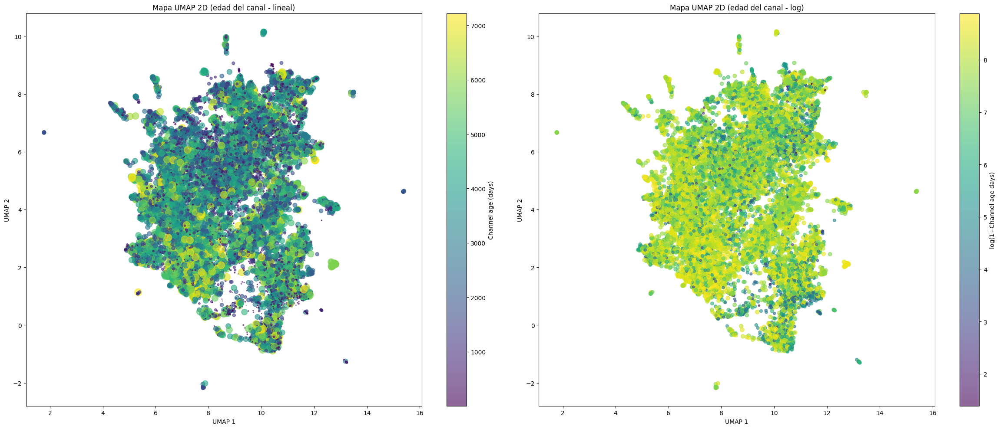

In [27]:

plt.figure(figsize=(24,10))

# --- Escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["channel_age_days"], cmap="viridis",
            s=df["channel_age_days"]/50, alpha=0.6)
plt.colorbar(label="Channel age (days)")
plt.title("Mapa UMAP 2D (edad del canal - lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Escala LOGARÍTMICA (opcional) ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["channel_age_days"]), cmap="viridis",
            s=np.log1p(df["channel_age_days"])*5, alpha=0.6)
plt.colorbar(label="log(1+Channel age days)")
plt.title("Mapa UMAP 2D (edad del canal - log)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()
plt.show()

In [28]:
df.groupby("cluster_umap5")["channel_age_days"].median().sort_values(ascending=False).head()

cluster_umap5
25    3725.0
23    3685.5
24    3494.0
12    3146.5
4     2944.5
Name: channel_age_days, dtype: float64

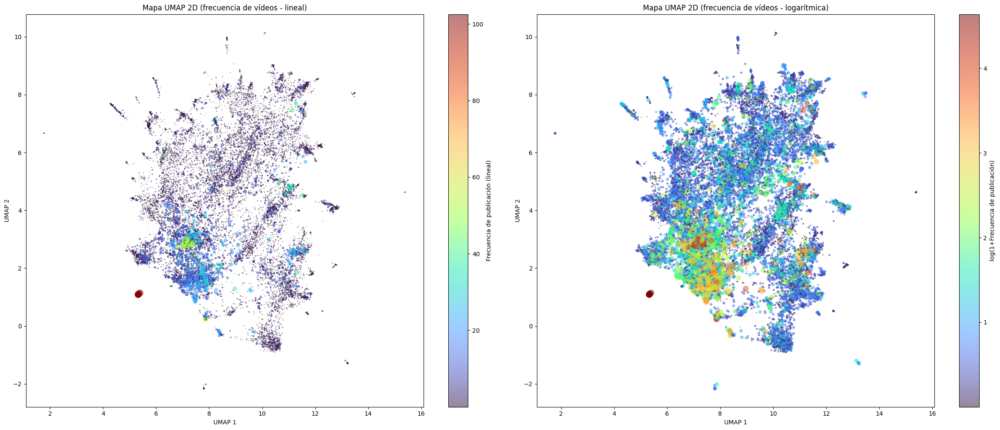

In [29]:
plt.figure(figsize=(24,10))

# --- Escala LINEAL ---
plt.subplot(1,2,1)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=df["frecuencia_videos"], cmap="turbo",
            s=df["frecuencia_videos"], alpha=0.5)   # tamaño directo
plt.colorbar(label="Frecuencia de publicación (lineal)")
plt.title("Mapa UMAP 2D (frecuencia de vídeos - lineal)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# --- Escala LOGARÍTMICA ---
plt.subplot(1,2,2)
plt.scatter(df["umap2_x"], df["umap2_y"],
            c=np.log1p(df["frecuencia_videos"]), cmap="turbo",
            s=np.log1p(df["frecuencia_videos"])*20, alpha=0.5)
plt.colorbar(label="log(1+Frecuencia de publicación)")
plt.title("Mapa UMAP 2D (frecuencia de vídeos - logarítmica)")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

plt.tight_layout()
plt.show()

In [30]:
df.groupby("cluster_umap5")["frecuencia_videos"].median().sort_values(ascending=False).head()

cluster_umap5
23    2.780826
25    2.657143
0     1.208696
10    0.986351
8     0.822917
Name: frecuencia_videos, dtype: float64

In [31]:
yt_categories = {
    1:  "Film & Animation",
    2:  "Autos & Vehicles",
    10: "Music",
    15: "Pets & Animals",
    17: "Sports",
    18: "Short Movies",
    19: "Travel & Events",
    20: "Gaming",
    21: "Videoblogging",
    22: "People & Blogs",
    23: "Comedy",
    24: "Entertainment",
    25: "News & Politics",
    26: "Howto & Style",
    27: "Education",
    28: "Science & Technology",
    29: "Nonprofits & Activism",
    30: "Movies",
    31: "Anime/Animation",
    32: "Action/Adventure",
    33: "Classics",
    34: "Comedy (Movies)",
    35: "Documentary",
    36: "Drama",
    37: "Family",
    38: "Foreign",
    39: "Horror",
    40: "Sci-Fi/Fantasy",
    41: "Thriller",
    42: "Shorts",
    43: "Shows",
    44: "Trailers"
}

In [32]:
df["category_name"] = df["category_id"].map(yt_categories)

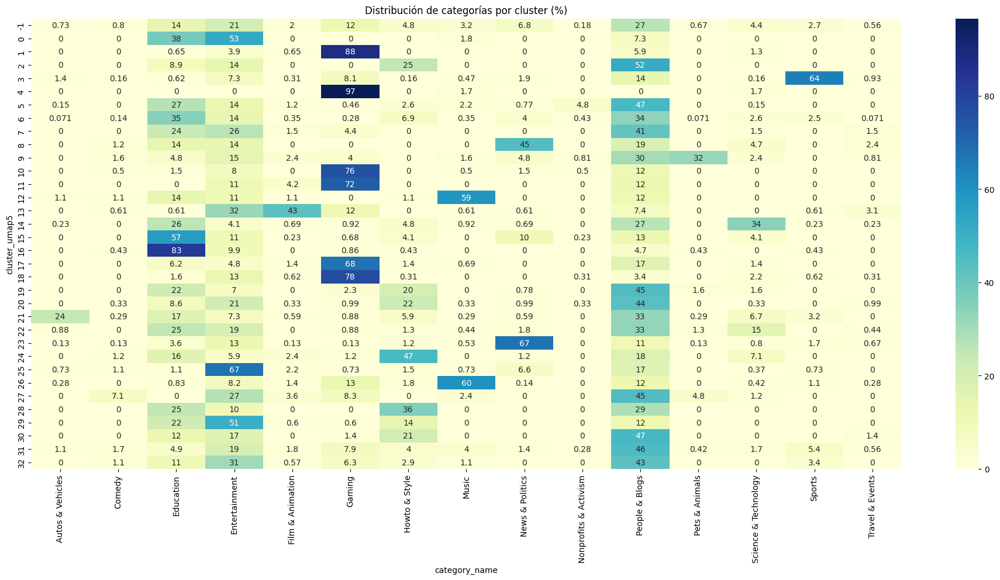

In [33]:
plt.figure(figsize=(24,10))
sns.heatmap(
    pd.crosstab(df["cluster_umap5"], df["category_name"], normalize="index")*100,
    cmap="YlGnBu", annot=True
)
plt.title("Distribución de categorías por cluster (%)")
plt.show()

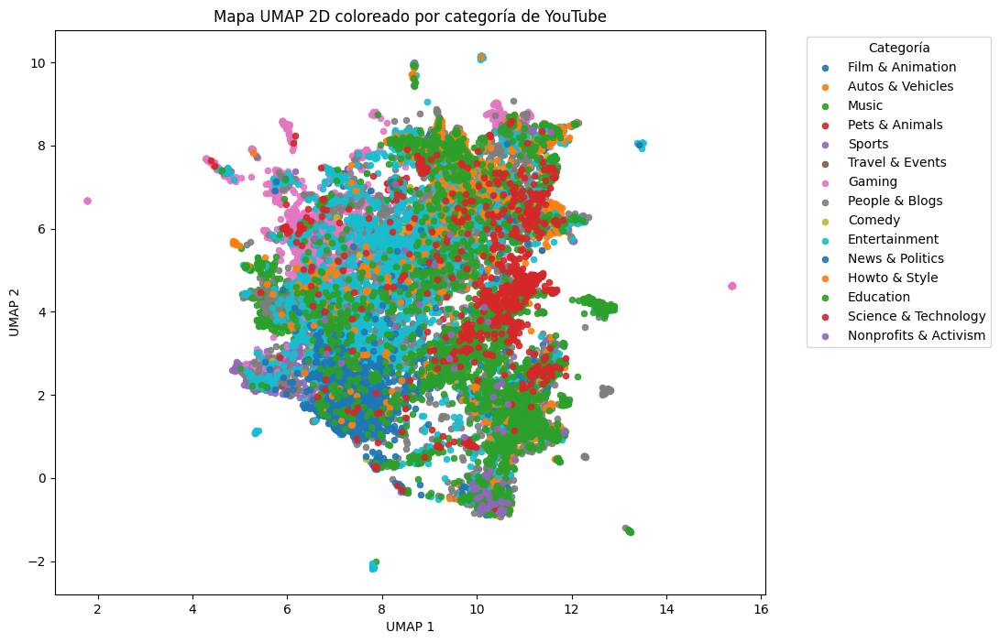

In [34]:
plt.figure(figsize=(10,8))

for cat, group in df.groupby("category_id"):
    plt.scatter(group["umap2_x"], group["umap2_y"],
                label=yt_categories.get(cat, cat),   # usa nombre en vez de ID
                s=20, alpha=0.9)

plt.legend(title="Categoría", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.title("Mapa UMAP 2D coloreado por categoría de YouTube")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.show()

In [ ]:

ct = pd.crosstab(df["category_name"], df["cluster_umap5"], normalize="index") * 100

# 2) Eliminar columna de ruido si existe
ct_no_noise = ct.drop(columns=-1, errors="ignore")

# 3) Filtrar valores menores o iguales a 20%
filtered = ct_no_noise.where(ct_no_noise > 20)

# 4) Opcional: eliminar filas donde todos los valores son NaN
filtered = filtered.dropna(how="all")

# 5) Formatear a dos decimales
filtered = filtered.round(2)

# Mostrar
print(filtered)

cluster_umap5          0   1   2      3   4      5   6   7   8      9   ...  \
category_name                                                           ...   
Autos & Vehicles      NaN NaN NaN    NaN NaN    NaN NaN NaN NaN    NaN  ...   
Film & Animation      NaN NaN NaN    NaN NaN    NaN NaN NaN NaN    NaN  ...   
Music                 NaN NaN NaN    NaN NaN    NaN NaN NaN NaN    NaN  ...   
News & Politics       NaN NaN NaN    NaN NaN    NaN NaN NaN NaN    NaN  ...   
Nonprofits & Activism NaN NaN NaN    NaN NaN  52.54 NaN NaN NaN    NaN  ...   
Pets & Animals        NaN NaN NaN    NaN NaN    NaN NaN NaN NaN  36.04  ...   
Science & Technology  NaN NaN NaN    NaN NaN    NaN NaN NaN NaN    NaN  ...   
Sports                NaN NaN NaN  54.56 NaN    NaN NaN NaN NaN    NaN  ...   

cluster_umap5             23  24  25     26  27  28  29  30  31  32  
category_name                                                        
Autos & Vehicles         NaN NaN NaN    NaN NaN NaN NaN NaN NaN NaN  

Se identificaron ocho categorías que presentan al menos un 20 % de coincidencia con un espacio semántico delimitado por alguno de los clusters obtenidos (Autos & Vehicles, Film & Animation, Music, News & Politics, Nonprofits & Activism, Pets & Animals, Science & Technology y Sports).
De ellas, cuatro categorías muestran una alta correspondencia (superior al 45 %) con un cluster específico, lo que indica una alineación significativa entre la semántica del contenido y las temáticas reconocidas por YouTube (Nonprofit y activism, Sports, autos y vehiculos; y música)

In [36]:
#filtered.to_csv("/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/filtered_clusters_categorias.csv")

In [37]:


# ---------------------------------------------
# Utilidad: stopwords ES+EN (sin dependencias externas)
# (puedes reemplazar por NLTK si lo prefieres)
# ---------------------------------------------
STOP_ES = {
    "de","la","que","el","en","y","a","los","del","se","las","por","un","para","con","no","una","su","al","lo",
    "como","más","o","pero","sus","le","ya","o","este","sí","porque","esta","entre","cuando","muy","sin","sobre",
    "también","me","hasta","hay","donde","quien","desde","todo","nos","durante","todos","uno","les","ni","contra",
    "otros","ese","eso","ante","ellos","e","esto","mí","antes","algunos","qué","unos","yo","otro","otras","otra",
    "él","tanto","esa","estos","mucho","quienes","nada","muchos","cual","poco","ella","estar","estas","algunas",
    "algo","nosotros","mi","mis","tú","te","ti","tu","tus","ellas","nosotras","vosostros","vosotras","os",
    "mío","mía","míos","mías","tuyo","tuya","tuyos","tuyas","suyo","suya","suyos","suyas","nuestro","nuestra",
    "nuestros","nuestras","vuestro","vuestra","vuestros","vuestras","esos","esas","estoy","estás","está","estamos",
    "estáis","están","esté","estés","estemos","estéis","estén","estaré","estarás","estará","estaremos","estaréis",
    "estarán","estaba","estabas","estábamos","estabais","estaban","estuve","estuviste","estuvo","estuvimos",
    "estuvisteis","estuvieron","estuviera","estuvieras","estuviéramos","estuvierais","estuvieran","estuviese",
    "estuvieses","estuviésemos","estuvieseis","estuviesen","estando","estado","estada","estados","estadas","estad"
}
STOP_EN = {
    "the","a","an","and","or","if","then","else","when","of","for","on","in","to","from","by","with","without","about",
    "as","is","are","was","were","be","been","being","at","this","that","these","those","it","its","into","than","so",
    "such","not","no","but","can","cannot","could","should","would","will","just","only","over","under","again","both",
    "more","most","less","least","very","do","does","did","doing","done","up","down","out","off","your","you","yours",
    "we","our","ours","they","their","theirs","i","me","my","mine","he","him","his","she","her","hers","them","us"
}
STOPWORDS = STOP_ES | STOP_EN

# ---------------------------------------------
# Limpieza ligera para TF-IDF (mantiene # y @)
# ---------------------------------------------
def _clean_for_tfidf(s: str) -> str:
    s = str(s).lower()
    s = re.sub(r"https?://\S+|www\.\S+", " ", s)         # quitar urls
    s = re.sub(r"[^\wáéíóúñü#@\s]", " ", s)              # conserva # y @
    toks = [t for t in s.split() if t not in STOPWORDS and len(t) > 2]
    return " ".join(toks)

# ---------------------------------------------
# Función principal
# ---------------------------------------------
def top_terms_by_cluster(
    df: pd.DataFrame,
    text_col: str = "text_video",           # texto bruto (título+desc+tags)
    cluster_col: str = "cluster_umap5",     # etiquetas de cluster (HDBSCAN)
    top_n: int = 12,                         # nº de términos a devolver por cluster
    min_docs: int = 25,                      # mínimo de vídeos para considerar el cluster
    max_features: int = 8000,                # vocabulario TF-IDF
    ngram_range: tuple = (1,2),              # unigrams + bigrams por defecto
    exclude_noise: bool = True               # descartar cluster -1
) -> pd.DataFrame:
    """
    Devuelve un DataFrame con los 'top_n' términos más 'centrales' por cluster,
    medidos como LIFT = (media TF-IDF del cluster) - (media TF-IDF global).
    """
    # 0) opcional: excluir ruido
    data = df.copy()
    if exclude_noise and cluster_col in data.columns:
        data = data[data[cluster_col] != -1]

    # 1) limpiar texto para TF-IDF (no uses este texto para embeddings)
    text_clean = data[text_col].fillna("").map(_clean_for_tfidf)

    # 2) TF-IDF global (fit sobre todo el corpus)
    vec = TfidfVectorizer(stop_words=None, max_features=max_features, ngram_range=ngram_range)
    Xt = vec.fit_transform(text_clean)
    terms = vec.get_feature_names_out()
    Xt = Xt.tocsc()  # acceso por columnas más rápido

    # 3) medias globales
    global_mean = Xt.mean(axis=0).A1  # (V,)

    # 4) calcular lift por cluster
    rows = []
    for cl, idx in data.groupby(cluster_col).indices.items():
        if len(idx) < min_docs:
            continue
        cluster_mean = Xt[idx].mean(axis=0).A1
        lift = cluster_mean - global_mean
        top_idx = np.argsort(lift)[-top_n:][::-1]
        selected = [(terms[i], float(lift[i]), float(cluster_mean[i])) for i in top_idx if lift[i] > 0]
        if not selected:
            continue
        for term, lift_val, mean_val in selected:
            rows.append({
                "cluster": cl,
                "term": term,
                "lift": lift_val,           # exceso vs corpus (cuanto más >0, más distintivo del cluster)
                "tfidf_cluster_mean": mean_val,
                "docs_in_cluster": len(idx)
            })

    out = pd.DataFrame(rows).sort_values(["cluster", "lift"], ascending=[True, False])
    return out

# ---------------------------------------------
# Uso típico
# ---------------------------------------------

# - df["text_video"]            -> texto bruto (para embeddings)
# - df["cluster_umap5"]         -> etiquetas de cluster (HDBSCAN en UMAP 5D)
# #Primero genera una versión limpia SOLO para TF-IDF interpretativo (no para embeddings):
df["text_video_clean"] = df["text_video"].map(_clean_for_tfidf)

#Y luego llama:
keywords = top_terms_by_cluster(
    df.assign(text_video=df["text_video"]), # o cambia text_col="text_video_clean"
    text_col="text_video_clean",
    cluster_col="cluster_umap5",
    top_n=12, min_docs=25,
    max_features=8000, ngram_range=(1,2),
    exclude_noise=True
)
display(keywords)

,cluster,term,lift,tfidf_cluster_mean,docs_in_cluster
0,0,nihan,0.168349,0.169322,55
1,0,amor eterno,0.151433,0.152312,55
2,0,eterno,0.137174,0.138260,55
3,0,kemal,0.134906,0.135686,55
4,0,triste,0.113695,0.114590,55
...,...,...,...,...,...
391,32,draw,0.059911,0.061853,175
392,32,how draw,0.059370,0.061100,175
393,32,short,0.054033,0.057043,175
394,32,desc,0.047238,0.079565,175


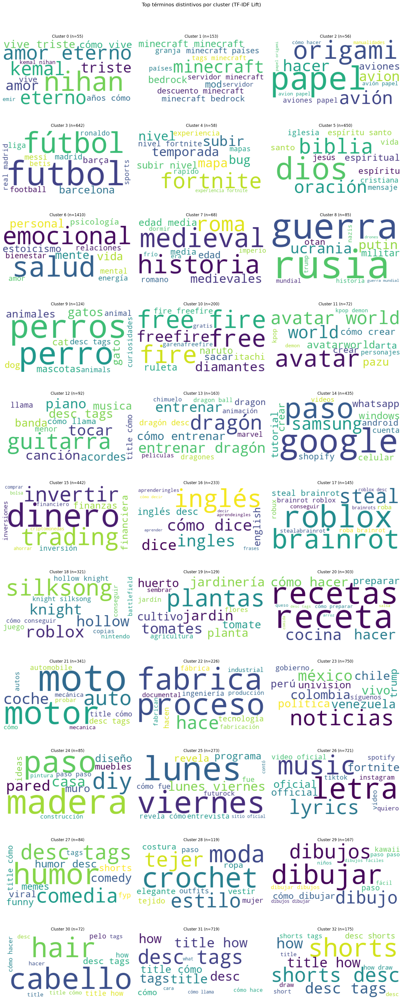

In [38]:
n_clusters = len(keywords)
n_cols = 3
n_rows = int(np.ceil(n_clusters / n_cols))

n_clusters = keywords["cluster"].nunique()
n_cols = 3
n_rows = int(np.ceil(n_clusters / n_cols))

plt.figure(figsize=(n_cols*6, n_rows*4))

for i, cl in enumerate(sorted(keywords["cluster"].unique())):
    cluster_terms = keywords[keywords["cluster"] == cl]
    if cluster_terms.empty:
        continue
    
    # Diccionario término:lift para ponderar WordCloud
    frequencies = dict(zip(cluster_terms["term"], cluster_terms["lift"]))
    if not frequencies:
        continue
    
    ax = plt.subplot(n_rows, n_cols, i+1)
    wc = WordCloud(width=400, height=200, background_color="white").generate_from_frequencies(frequencies)
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"Cluster {cl} (n={cluster_terms['docs_in_cluster'].iloc[0]})", fontsize=12)

plt.tight_layout()
plt.suptitle("Top términos distintivos por cluster (TF-IDF Lift)", fontsize=16, y=1.02)
plt.show()

In [39]:
keywords.loc[(keywords["cluster"] == 3) | (keywords["cluster"] == 5)| (keywords["cluster"] == 6)| (keywords["cluster"] == 12) | (keywords["cluster"] == 16)| (keywords["cluster"] == 22)| (keywords["cluster"] == 31)| (keywords["cluster"] == 33)]

,cluster,term,lift,tfidf_cluster_mean,docs_in_cluster
36,3,futbol,0.071685,0.076923,642
37,3,fútbol,0.051355,0.055365,642
38,3,barcelona,0.047686,0.051186,642
39,3,barça,0.028439,0.030484,642
40,3,messi,0.024167,0.025958,642
...,...,...,...,...,...
379,31,cómo,0.033211,0.081424,719
380,31,cómo hace,0.010110,0.012366,719
381,31,what,0.007986,0.009558,719
382,31,cómo llama,0.007867,0.009436,719


In [40]:
print(keywords.loc[keywords["cluster"].isin([3, 5,
                                             #,6,12,16,
                                             #22,31,
                                             33])])

    cluster            term      lift  tfidf_cluster_mean  docs_in_cluster
36        3          futbol  0.071685            0.076923              642
37        3          fútbol  0.051355            0.055365              642
38        3       barcelona  0.047686            0.051186              642
39        3           barça  0.028439            0.030484              642
40        3           messi  0.024167            0.025958              642
41        3        football  0.024161            0.025973              642
42        3          madrid  0.023586            0.025683              642
43        3            liga  0.022441            0.024281              642
44        3           betis  0.018045            0.019561              642
45        3          sports  0.017763            0.019212              642
46        3         ronaldo  0.017032            0.018387              642
47        3     real madrid  0.017024            0.018271              642
60        5            di

In [41]:
# subset = keywords.loc[keywords["cluster"].isin([3, 5, 6, 12, 16, 22, 31, 33])]
# print(subset)
# print(f"\nTotal de filas: {len(subset)}")

In [42]:
# def terms_table(df_terms, k=10):
#     return (df_terms.sort_values(["cluster","lift"], ascending=[True,False])
#                   .groupby("cluster")["term"]
#                   .apply(lambda s: ", ".join(s.head(k)))
#                   .reset_index(name="top_terms"))

# # ejemplo:
# terms_table(keywords, k=20)

In [43]:
#df1=pd.read_parquet("/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/df_video_with_embeddings_UMAP5_2.parquet")
#df2=pd.read_parquet("/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/df_YouTube_2025TFM_DEFINITIVO.parquet")

In [44]:
# print("Columnas dataset 1:", df1.columns.tolist())
# print("Columnas dataset 2:", df2.columns.tolist())

# # Columnas comunes y distintas
# columnas_comunes = df1.columns.intersection(df2.columns)
# columnas_diferentes = df1.columns.symmetric_difference(df2.columns)
# print("Columnas comunes:", columnas_comunes.tolist())
# print("Columnas distintas:", columnas_diferentes.tolist())

# # Tipos de datos
# print(df1.dtypes)
# print(df2.dtypes)